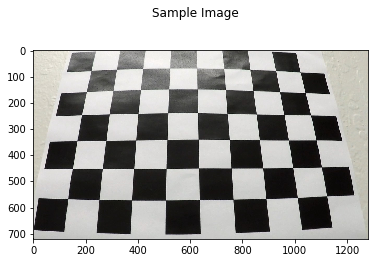

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import math

%matplotlib inline

# Read in calibration images
image_paths = glob.glob('camera_cal/calibration*.jpg')

# Let's pick one image to show the pipeline process
sample_chess_image = mpimg.imread(image_paths[13])

plt.suptitle('Sample Image')
plt.imshow(sample_chess_image)
plt.savefig('output_images/sample_chess.png', dpi=300)

17 images with corners found


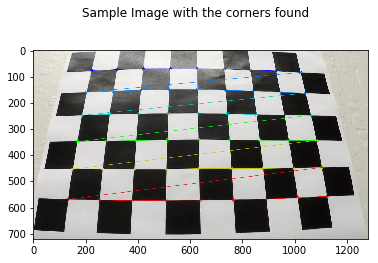

In [2]:
def find_corners(img):    
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return cv2.findChessboardCorners(gray, (9,6), None)
    
# This will store the succesfully found object and image points
objpoints = []
imgpoints = []
found_corners = 0

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

for image_path in image_paths:
    img = mpimg.imread(image_path)
    ret, corners = find_corners(img)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        found_corners += 1

print(found_corners, 'images with corners found')

# Show corners for our sample image
ret, corners = find_corners(sample_chess_image)
img = cv2.drawChessboardCorners(sample_chess_image.copy(), (9,6), corners, ret)
plt.suptitle('Sample Image with the corners found')
plt.imshow(img)
plt.savefig('output_images/sample_chess_corners.png', dpi=300)

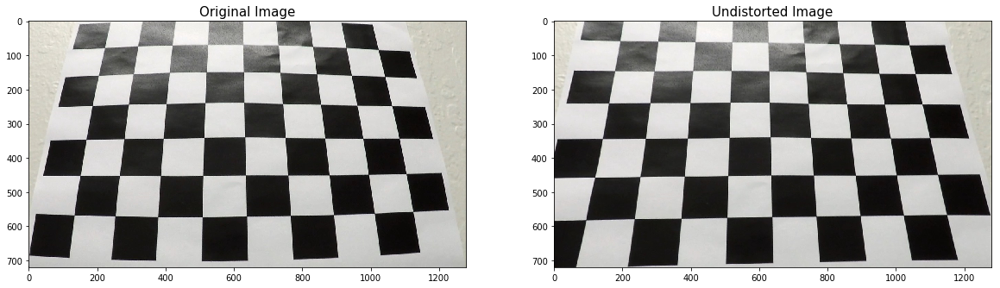

In [3]:
# This function will return an undistorted image
def undistort_image(img, mtx, dist):
    # Generate sample undistorted image
    undistorted_image = cv2.undistort(img, mtx, dist, None, mtx)

    return undistorted_image

# Now we are going to calibrate the camera, we assume the shape of the image 
# is in the form (height, width, channels)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, sample_chess_image.shape[0:2][::-1], None, None)

# Undistort the sample image
sample_chess_image_undistorted = undistort_image(sample_chess_image, mtx, dist)

# We show the original and the undistorted image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(sample_chess_image)
ax1.set_title('Original Image', fontsize=15)
ax2.imshow(sample_chess_image_undistorted)
ax2.set_title('Undistorted Image', fontsize=15)
plt.savefig('output_images/undistorted_chess.png', dpi=300)

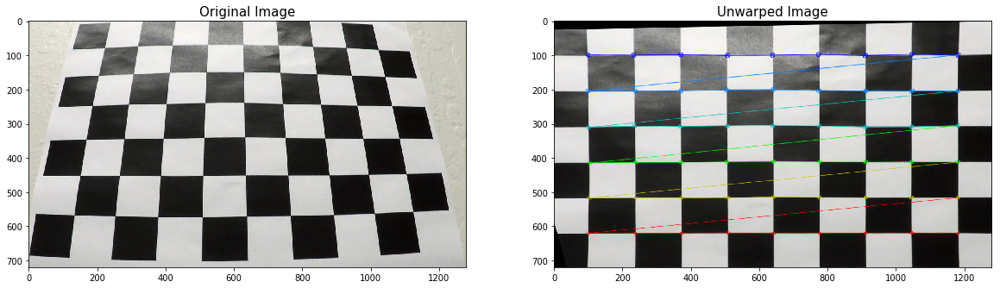

In [4]:
def warp_perspective(img, M):
    # Warp the image using OpenCV warpPerspective()
    return cv2.warpPerspective(img, M, img.shape[0:2][::-1], flags = cv2.INTER_LINEAR)

def apply_transformation(img, src, dst):
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warped = warp_perspective(img, M)
    return warped, M, Minv
    
# Function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Get the undistorted image
    undist = undistort_image(img, mtx, dist)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        
        # Return the resulting image and matrix
        return apply_transformation(undist, src, dst)

# Run the function
unwarped_chess_image, M, Minv = corners_unwarp(sample_chess_image, 9, 6, mtx, dist)

# We show the original and the unwarped image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(sample_chess_image)
ax1.set_title('Original Image', fontsize=15)
ax2.imshow(unwarped_chess_image)
ax2.set_title('Unwarped Image', fontsize=15)
plt.savefig('output_images/unwarped_chess.png', dpi=300)

In [5]:
# Read in test images
image_paths = glob.glob('test_images/test*.jpg')
image_paths.append('test_images/straight_lines1.jpg')
image_paths.append('test_images/straight_lines2.jpg')

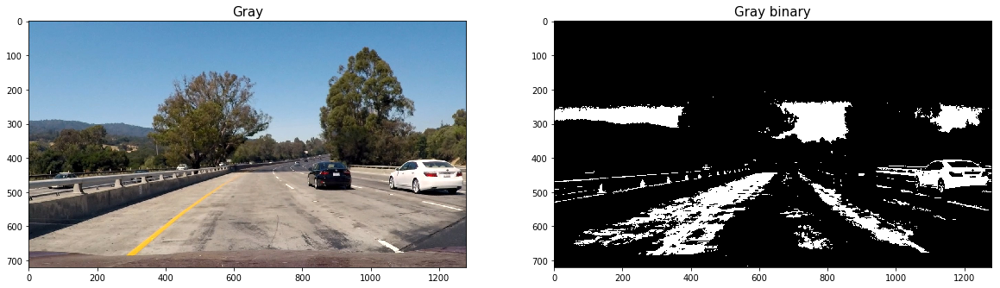

In [6]:
# Next we are going to explore why we select the HLS color space

# Let's take another image sample to show the difference of working in different spaces
sample_image = mpimg.imread(image_paths[0])

thresh = (180, 255)
gray = cv2.cvtColor(sample_image, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(gray)
binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1

# We show the original and the filtered image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(sample_image)
ax1.set_title('Gray', fontsize=15)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Gray binary', fontsize=15)
plt.savefig('output_images/gray_binary.png', dpi=300)

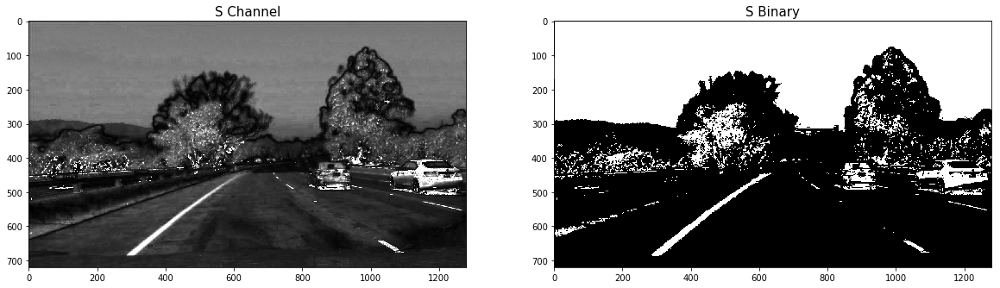

In [7]:
# We convert to HLS and then we only take the S channel
hls = cv2.cvtColor(sample_image, cv2.COLOR_RGB2HLS)
S = hls[:,:,2]

thresh = (90, 255)
binary = np.zeros_like(S)
binary[(S > thresh[0]) & (S <= thresh[1])] = 1

# We show the S channel and the filtered image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(S, cmap='gray')
ax1.set_title('S Channel', fontsize=15)
ax2.imshow(binary, cmap='gray')
ax2.set_title('S Binary', fontsize=15)
plt.savefig('output_images/s_binary.png', dpi=300)

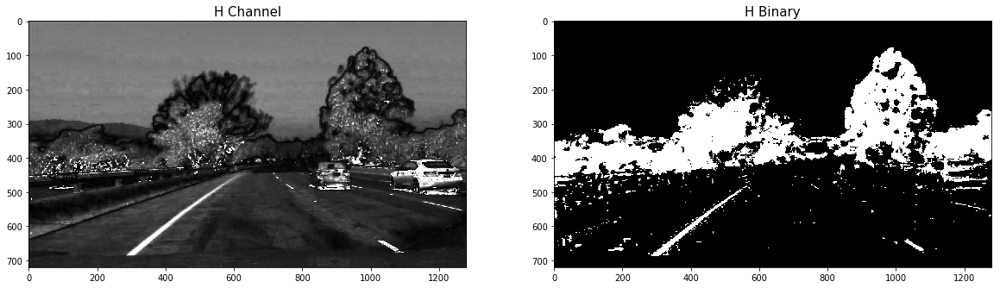

In [8]:
# Now we try the same thing with the H channel

H = hls[:,:,0]

thresh = (18, 100)
binary = np.zeros_like(H)
binary[(H > thresh[0]) & (H <= thresh[1])] = 1

# We show the H channel and the filtered image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(S, cmap='gray')
ax1.set_title('H Channel', fontsize=15)
ax2.imshow(binary, cmap='gray')
ax2.set_title('H Binary', fontsize=15)
plt.savefig('output_images/h_binary.png', dpi=300)

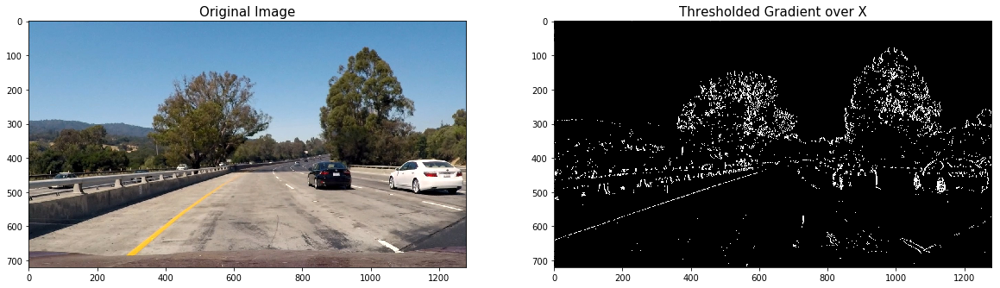

In [9]:
# Function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255, convert_to_gray = False):
    
    if convert_to_gray:
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
        
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

# Run the function
grad_binaryx = abs_sobel_thresh(sample_image, orient='x', thresh_min=30, thresh_max=230, convert_to_gray=True)

# We show the original and the thresholded x gradient image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(sample_image)
ax1.set_title('Original Image', fontsize=15)
ax2.imshow(grad_binaryx, cmap='gray')
ax2.set_title('Thresholded Gradient over X', fontsize=15)
plt.savefig('output_images/thresholded_gradient_x.png', dpi=300)

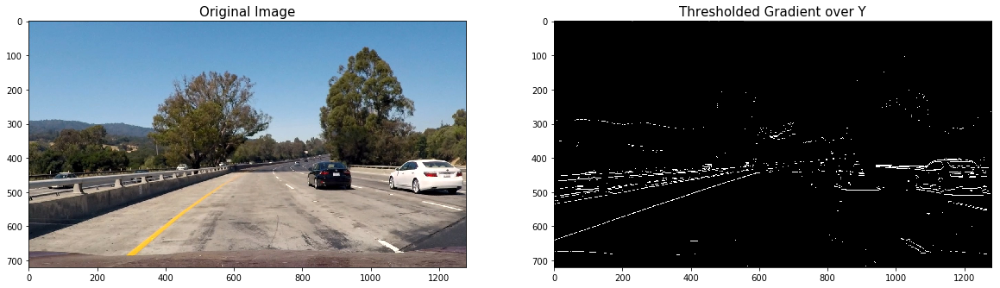

In [10]:
# Run the function
grad_binaryy = abs_sobel_thresh(sample_image, orient='y', thresh_min=70, thresh_max=230, convert_to_gray = True)

# We show the original and the thresholded x gradient image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(sample_image)
ax1.set_title('Original Image', fontsize=15)
ax2.imshow(grad_binaryy, cmap='gray')
ax2.set_title('Thresholded Gradient over Y', fontsize=15)
plt.savefig('output_images/thresholded_gradient_y.png', dpi=300)

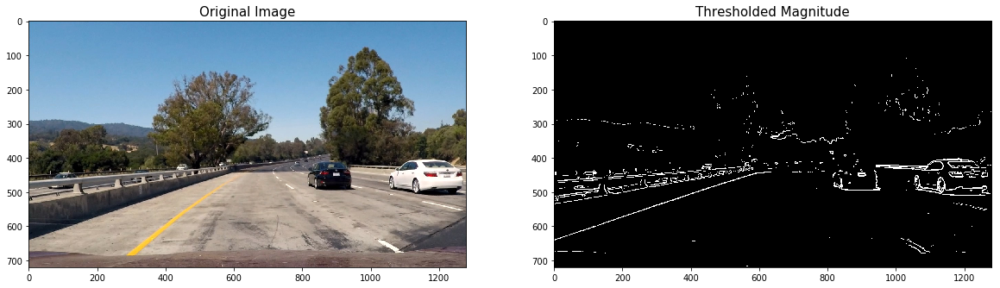

In [11]:
# Function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255), convert_to_gray = False):
    if convert_to_gray:
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
        
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Choose a Sobel kernel size
ksize = 7 # Choose a larger odd number to smooth gradient measurements

# Run the function
mag_binary = mag_thresh(sample_image, sobel_kernel=ksize, mag_thresh=(80, 255), convert_to_gray = True)

# We show the original and the thresholded gradient image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(sample_image)
ax1.set_title('Original Image', fontsize=15)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=15)
plt.savefig('output_images/thresholded_magnitude.png', dpi=300)

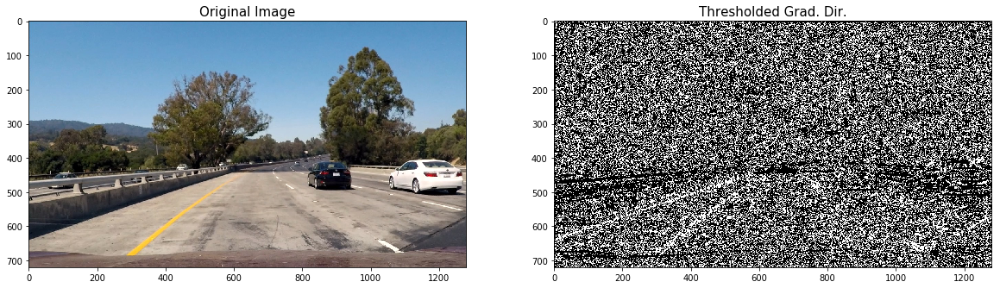

In [12]:
# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2), convert_to_gray = False):
    if convert_to_gray:
        # Grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Run the function
dir_binary = dir_threshold(sample_image, sobel_kernel=ksize, thresh=(0.7, 1.3), convert_to_gray = True)

# We show the original and the thresholded gradient image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(sample_image)
ax1.set_title('Original Image', fontsize=15)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=15)
plt.savefig('output_images/thresholded_grad_dir.png', dpi=300)

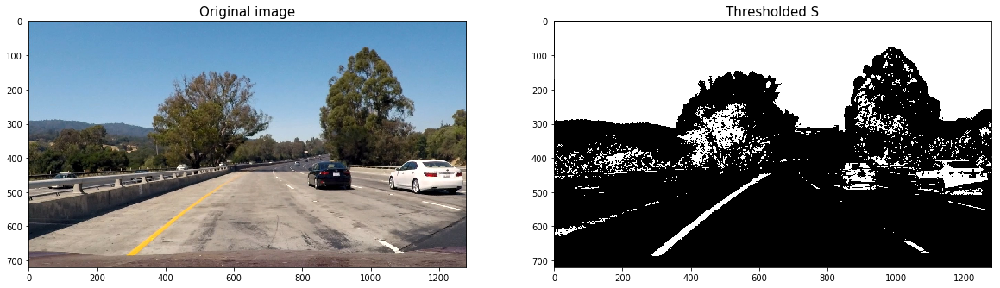

In [13]:
# Function that thresholds the S-channel of HLS
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

hls_binary = hls_select(sample_image, thresh=(90, 255))

# We show the original and the filtered image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(sample_image)
ax1.set_title('Original image', fontsize=15)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=15)
plt.savefig('output_images/thresholded_s.png', dpi=300)

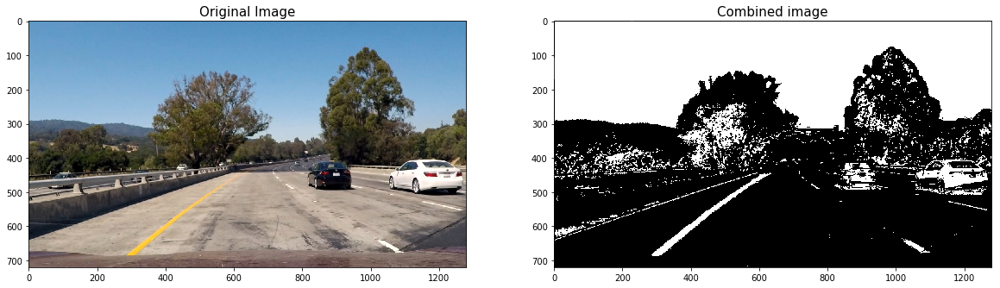

In [14]:
# We combine the images for pixels where both the x and y gradients meet the 
# threshold criteria, or the gradient magnitude and direction are both within their threshold values.
combined = np.zeros_like(dir_binary)
combined[(((grad_binaryx == 1) & (grad_binaryy == 1)) | (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

# We show the original and the thresholded gradient image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(sample_image)
ax1.set_title('Original Image', fontsize=15)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined image', fontsize=15)
plt.savefig('output_images/combined_image.png', dpi=300)

In [15]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        # x values of the most recent fit
        self.current_xfit = []  
        # y values of the most recent fit
        self.current_yfit = []  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

# Define a class that will process each image/frame
class ImageProcessor():
    def __init__(self):
        self.left_lane = Line()
        self.right_lane = Line()
        
    def region_of_interest(self, img, vertices):
        """
        Applies an image mask.

        Only keeps the region of the image defined by the polygon
        formed from `vertices`. The rest of the image is set to black.
        """
        #defining a blank mask to start with
        mask = np.zeros_like(img)   

        #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
        if len(img.shape) > 2:
            channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
            ignore_mask_color = (255,) * channel_count
        else:
            ignore_mask_color = 255

        #filling pixels inside the polygon defined by "vertices" with the fill color    
        cv2.fillPoly(mask, vertices, ignore_mask_color)

        #returning the image only where mask pixels are nonzero
        masked_image = cv2.bitwise_and(img, mask)
        return masked_image

    # Now we are going to create the pipeline that will be used to process each image
    def pipeline(self, img, mtx, dist):     

        # Kernel size
        ksize = 7

        img = undistort_image(img, mtx, dist)
        img = cv2.GaussianBlur(img, (ksize, ksize), 0)

        #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        #grad_binaryx = abs_sobel_thresh(gray, orient='x', thresh_min=30, thresh_max=230)
        #grad_binaryy = abs_sobel_thresh(gray, orient='y', thresh_min=70, thresh_max=230)
        #mag_binary = mag_thresh(gray, sobel_kernel=ksize, mag_thresh=(80, 255))
        #dir_binary = dir_threshold(gray, sobel_kernel=ksize, thresh=(.7, 1.3))
        #hls_binary = hls_select(img, thresh=(90, 255))

        # We combine the images for pixels where both the x and y gradients meet the 
        # threshold criteria, or the gradient magnitude and direction are both within their threshold values.
        # This time we also include the binary selection made on the HLS values
        combined = np.zeros_like(dir_binary)
        
        ##### Added after the reviwer comments on how I can optimize my lane finding algorithm
        HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

        # For yellow
        yellow = cv2.inRange(HSV, (20, 100, 100), (50, 255, 255))

        # For white
        sensitivity_1 = 68
        white = cv2.inRange(HSV, (0,0,255-sensitivity_1), (255,20,255))

        sensitivity_2 = 60
        HSL = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        white_2 = cv2.inRange(HSL, (0,255-sensitivity_2,0), (255,255,sensitivity_2))
        white_3 = cv2.inRange(img, (200,200,200), (255,255,255))
        #####

        #combined[((yellow == 1) | () | (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
        
        combined = yellow | white | white_2 | white_3
        
        imshape = combined.shape
        vertices = np.array([[(0,imshape[0]),(imshape[1]/2-50, imshape[0]/2 + 80), (imshape[1]/2+50, imshape[0]/2 + 80), (imshape[1],imshape[0])]], dtype=np.int32) 

        return self.region_of_interest(combined, vertices)
    
    # This will be the function that we will apply to get a bird eye like image
    def transform_image(self, img):
        # Define the source points
        src = np.float32([[ 20, 690],      # bottom left
                          [ 550, 460],     # top left
                          [ 730, 460],     # top right
                          [ 1260, 690]])     # bottom right

        # Define the destination points
        dst = np.float32([
            (0, img.shape[0]),
            (0, 0),
            (img.shape[1], 0),
            (img.shape[1], img.shape[0])])

        return apply_transformation(img, src, dst)
    
    def __get_rad_pos(self, warped, ploty):
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension

        # Find the middle point of y
        y_eval = np.max(ploty)/2        
        
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(self.left_lane.current_yfit*ym_per_pix, self.left_lane.current_xfit*xm_per_pix, 2)
        right_fit_cr = np.polyfit(self.right_lane.current_yfit*ym_per_pix, self.right_lane.current_xfit*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
        curvature = (left_curverad + right_curverad) / 2
        
        y_eval = np.max(ploty)
        
        # To calculate the camera position we take the center of the image
        image_center = warped.shape[1]/2 * xm_per_pix # We convert pixels to real world distance

        # Now we need to find the two points that intersect y_eval
        left_x = left_fit_cr[0]*(y_eval*ym_per_pix)**2+left_fit_cr[1]*y_eval*ym_per_pix+left_fit_cr[2]
        right_x = right_fit_cr[0]*(y_eval*ym_per_pix)**2+right_fit_cr[1]*y_eval*ym_per_pix+right_fit_cr[2]
        
        # Calculate the distance between the two points
        lane_center = (right_x - left_x)/2 + left_x
        
        # Then we calculate the position of the camera
        camera_pos = image_center - lane_center
        if(camera_pos > 0):
            camera_pos = '{:.6} m to the right'.format(camera_pos)
        else:
            camera_pos = '{:.6} m to the left'.format(abs(camera_pos))
        return camera_pos, curvature
    
    def __validate_lines(self, left_fit, right_fit, threshold=(0.0003, 0.55)):
        diff_coeff_first = np.abs(left_fit[0] - right_fit[0])
        diff_coeff_second = np.abs(left_fit[1] - right_fit[1])

        return diff_coeff_first < threshold[0] and diff_coeff_second < threshold[1]
    
    # Sliding windows function
    def __sliding_window(self, img, margin, nonzero, nonzeroy, nonzerox, out_img = None):
        # Take a histogram of the bottom half of the image
        histogram = np.sum(img[int(img.shape[0]/2):,:], axis=0)
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(img.shape[0]/nwindows)

        # Set minimum number of pixels found to recenter window
        minpix = 50

        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = img.shape[0] - (window+1)*window_height
            win_y_high = img.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            if out_img is not None:
                # Draw the windows on the visualization image
                cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
                cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
        return left_lane_inds, right_lane_inds
    
    # This will be the function that will find the 2 lanes
    def find_lanes(self, img, out_img = None, video = True):
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        # Set the width of the windows +/- margin
        margin = 100
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        if self.left_lane.detected == True and self.right_lane.detected == True and video == True:
            left_fit = self.left_lane.current_fit
            right_fit = self.right_lane.current_fit
            left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
            right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
        else:
            left_lane_inds, right_lane_inds = self.__sliding_window(img, margin, nonzero, nonzeroy, nonzerox, out_img)
            # Concatenate the arrays of indices
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        
        if len(left_lane_inds) > 0 and len(right_lane_inds) > 0:
            # Extract left and right line pixel positions
            leftx = nonzerox[left_lane_inds]
            lefty = nonzeroy[left_lane_inds] 
            rightx = nonzerox[right_lane_inds]
            righty = nonzeroy[right_lane_inds] 

            # Fit a second order polynomial to each
            left_fit = np.polyfit(lefty, leftx, 2)
            right_fit = np.polyfit(righty, rightx, 2)        

            # Generate x and y values for plotting
            ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

            if self.__validate_lines(left_fit, right_fit):
                if len(left_lane_inds > 0):
                    self.left_lane.detected = True
                    self.left_lane.current_fit = left_fit
                    self.left_lane.recent_xfitted = left_fitx
                    self.left_lane.current_xfit = leftx
                    self.left_lane.current_yfit = lefty
                if len(right_lane_inds > 0):
                    self.right_lane.detected = True
                    self.right_lane.current_fit = right_fit
                    self.right_lane.recent_xfitted = right_fitx
                    self.right_lane.current_xfit = rightx
                    self.right_lane.current_yfit = righty
            
        return left_lane_inds, right_lane_inds
    
    def draw_lanes(self, warped, img, Minv, video = True):
        # We find the lanes for the current image
        left_lane_inds, right_lane_inds = self.find_lanes(warped, video = video)

        if len(left_lane_inds) == 0 or len(right_lane_inds) == 0:
            if self.left_lane.detected == False or self.right_lane.detected == False:
                return

        # Create an image to draw the lines on
        warp_zero = np.zeros_like(warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        # Generate y values for plotting
        ploty = np.linspace(0, img.shape[0]-1, warped.shape[0] )

        # Get the polynomial coefficients for the most recent fit 
        left_fitx = self.left_lane.recent_xfitted
        right_fitx = self.right_lane.recent_xfitted

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        cv2.polylines(color_warp, np.array([pts_left], dtype=np.int32), False,(255,0,0),thickness = 15)
        cv2.polylines(color_warp, np.array([pts_right], dtype=np.int32), False,(0,0,255),thickness = 15)
        
        # Add Camera position, left curve radius and right curve radius
        camera_pos, curv = self.__get_rad_pos(warped, ploty)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img,'Camera Position: {}'.format(camera_pos),(10,30), font, 1,(255,255,255),2)
        cv2.putText(img,'Curve rad {:.6} m'.format(curv) ,(10,60), font, 1,(255,255,255),2)
        
        
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = warp_perspective(color_warp, Minv) 
        # Combine the result with the original image
        result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
        
        return result
        
    def plot_lanes(self, img):
        # Set the width of the windows +/- margin
        margin = 100

        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        # Create an output image to draw on and  visualize the result, convert from binary to RGB
        out_img = np.dstack((img, img, img))*255
        
        left_lane_inds, right_lane_inds = self.find_lanes(img, out_img)

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate y values for plotting
        ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        window_img = np.zeros_like(out_img)
        left_fitx = self.left_lane.recent_xfitted
        right_fitx = self.right_lane.recent_xfitted
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

        return out_img, left_fitx, right_fitx, ploty
    
    def process_image(self, img):
        combined = processor.pipeline(img, mtx, dist)
        warped, M, Minv = processor.transform_image(combined)
        return self.draw_lanes(warped, img, Minv)
        
processor = ImageProcessor()


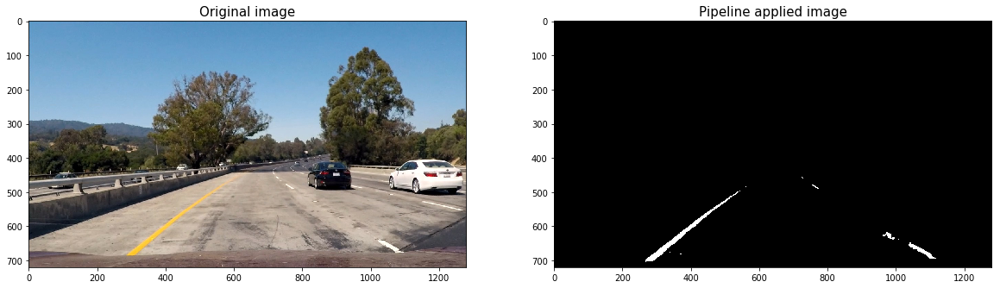

In [16]:
combined = processor.pipeline(sample_image, mtx, dist)
# We show the original and the filtered image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(sample_image)
ax1.set_title('Original image', fontsize=15)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Pipeline applied image', fontsize=15)
plt.savefig('output_images/pipeline_applied.png', dpi=300)

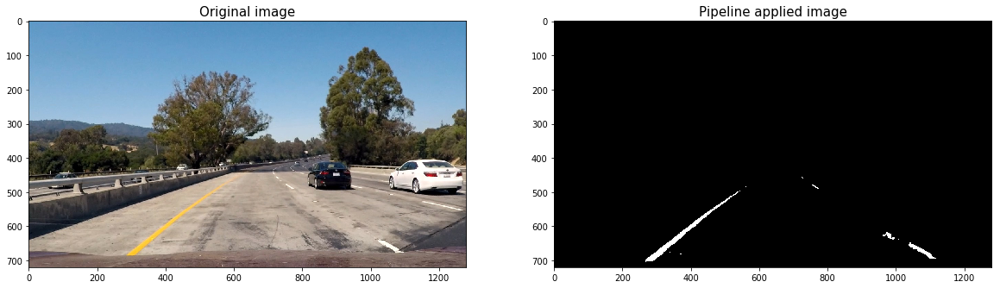

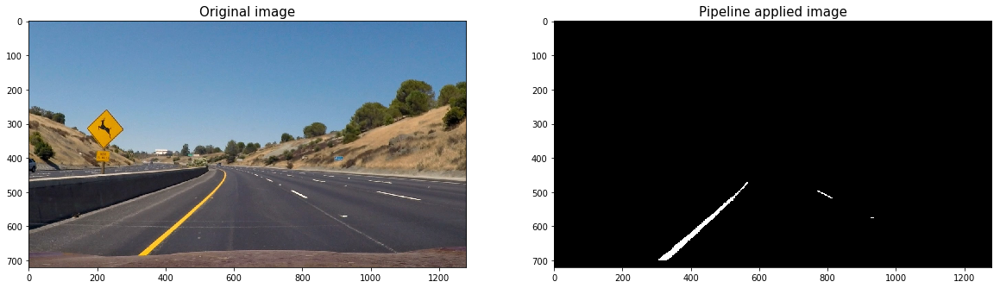

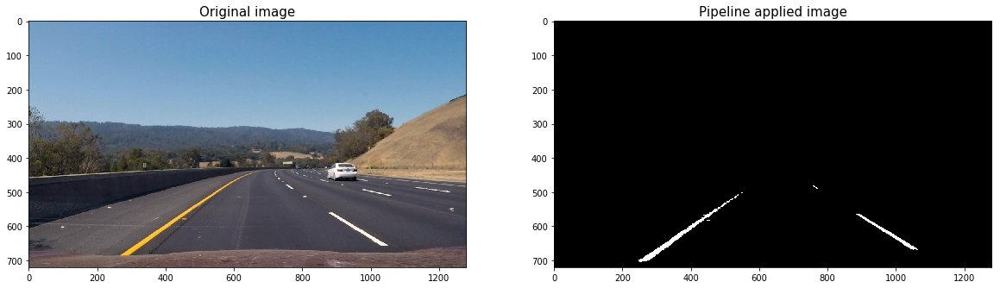

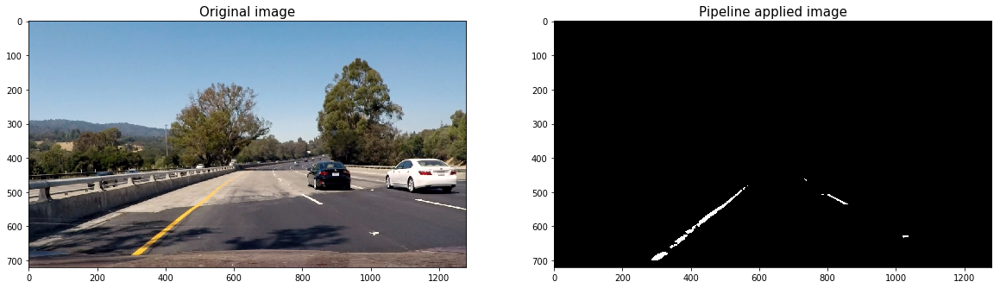

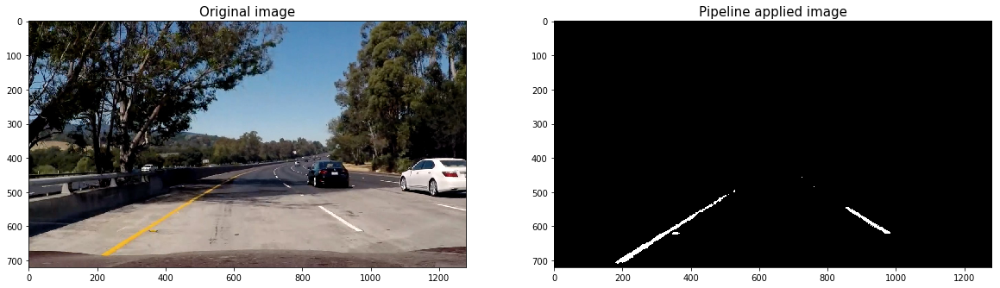

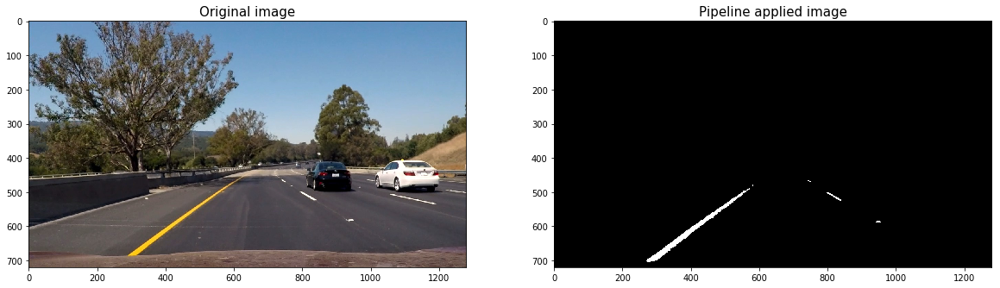

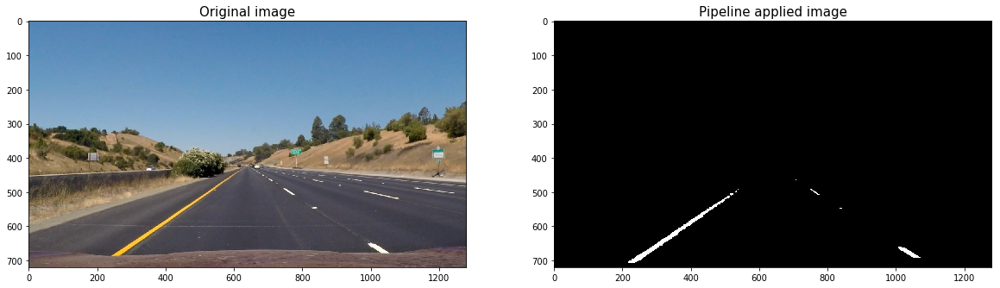

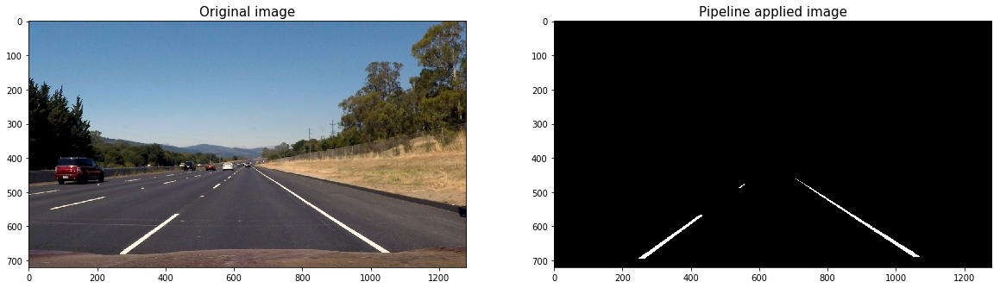

In [17]:
images = []
processed_images = []
for image_path in image_paths:
    image = mpimg.imread(image_path)
    combined = processor.pipeline(image, mtx, dist)
    images.append(image)
    processed_images.append(combined)
    
    # We show the original and the filtered image
    _, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(image)
    ax1.set_title('Original image', fontsize=15)
    ax2.imshow(combined, cmap='gray')
    ax2.set_title('Pipeline applied image', fontsize=15)

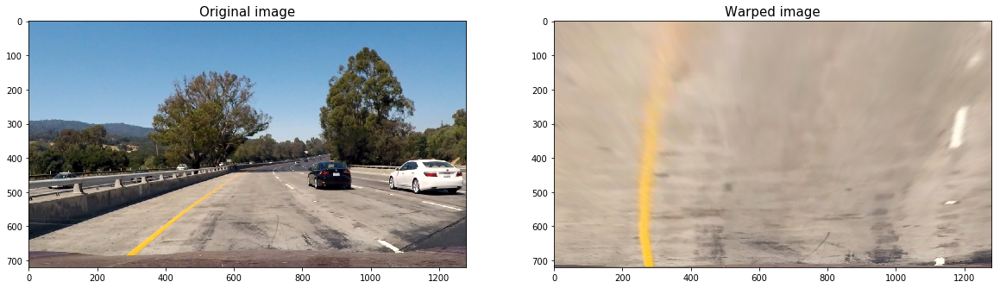

In [18]:
sample_image = images[0]
warped, M, Minv = processor.transform_image(sample_image)

# We show the original and the warped image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(sample_image)
ax1.set_title('Original image', fontsize=15)
ax2.imshow(warped, cmap='gray')
ax2.set_title('Warped image', fontsize=15)
plt.savefig('output_images/warped_image.png', dpi=300)

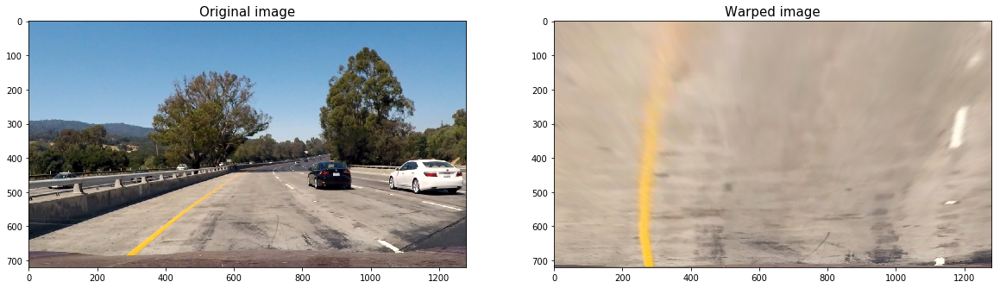

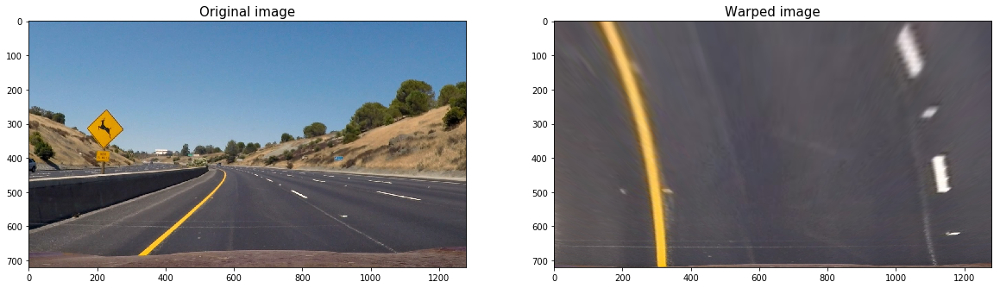

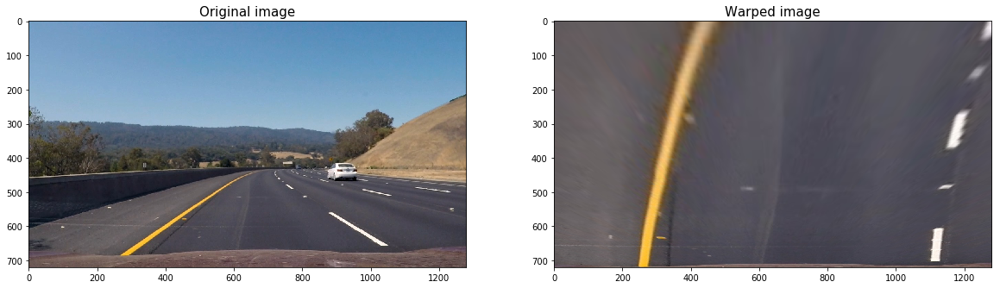

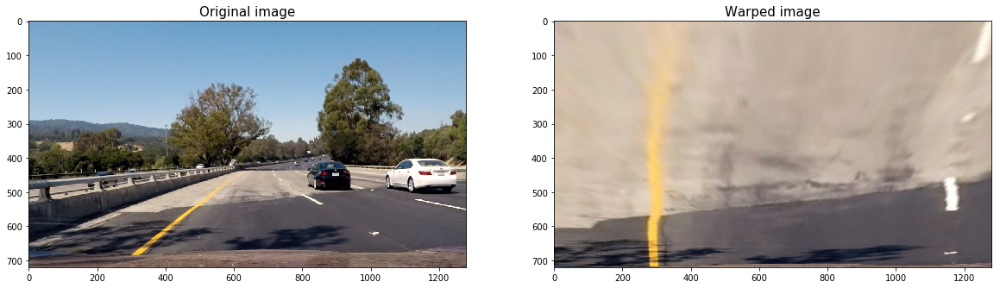

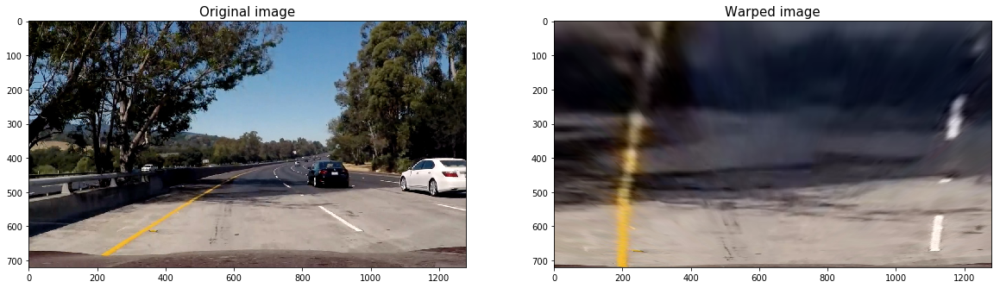

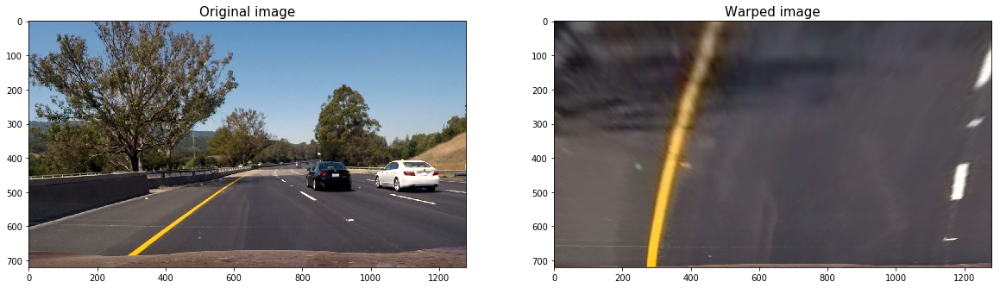

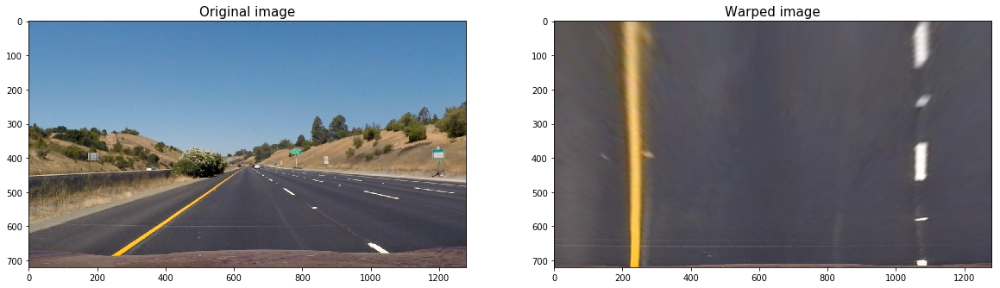

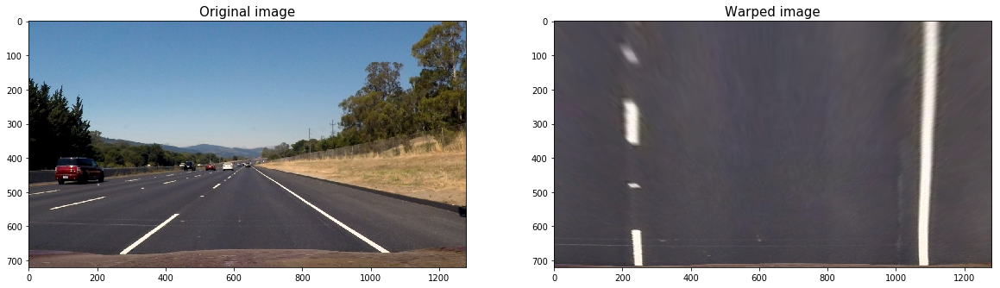

In [19]:
# Now we apply the previous transformation to the original images
for image in images:
    warped, M, Minv = processor.transform_image(image)
    
    # We show the original image and the warped image
    _, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(image, cmap='gray')
    ax1.set_title('Original image', fontsize=15)
    ax2.imshow(warped, cmap='gray')
    ax2.set_title('Warped image', fontsize=15)

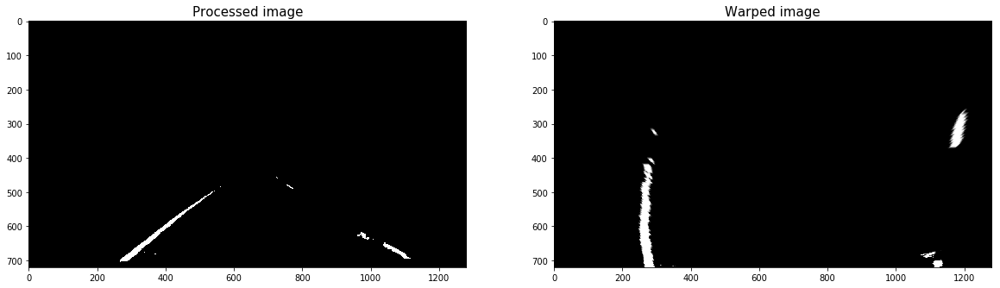

In [20]:
warped, M, Minv = processor.transform_image(processed_images[0])

# We show the processed image and the warped image
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(processed_images[0], cmap='gray')
ax1.set_title('Processed image', fontsize=15)
ax2.imshow(warped, cmap='gray')
ax2.set_title('Warped image', fontsize=15)
plt.savefig('output_images/warp_binary.png', dpi=300)

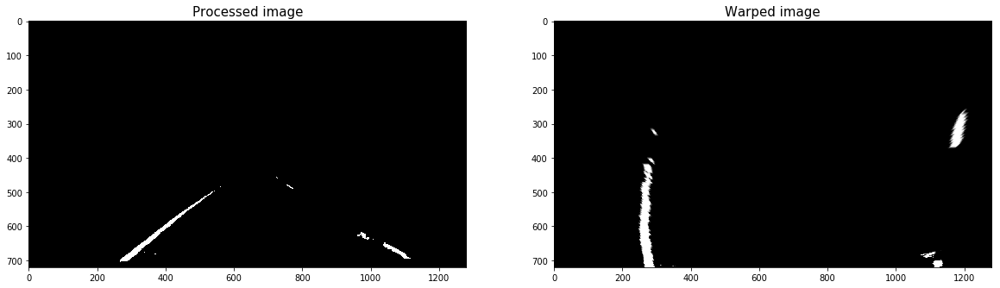

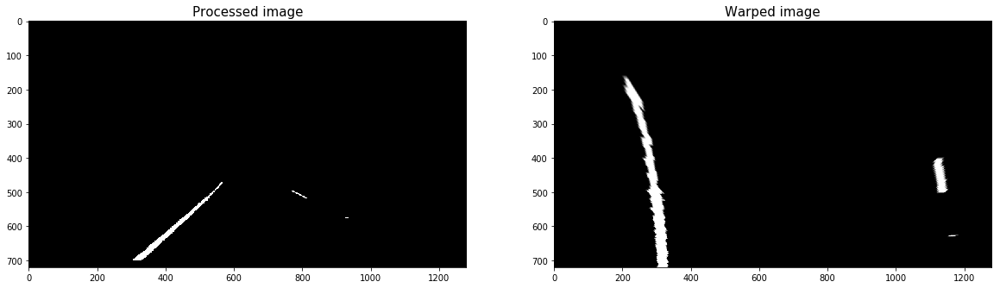

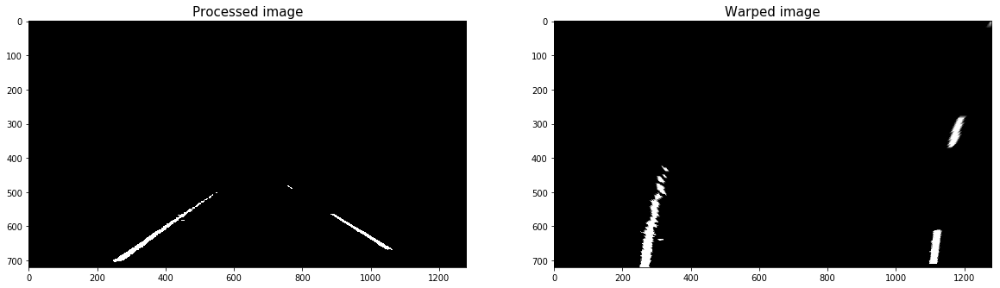

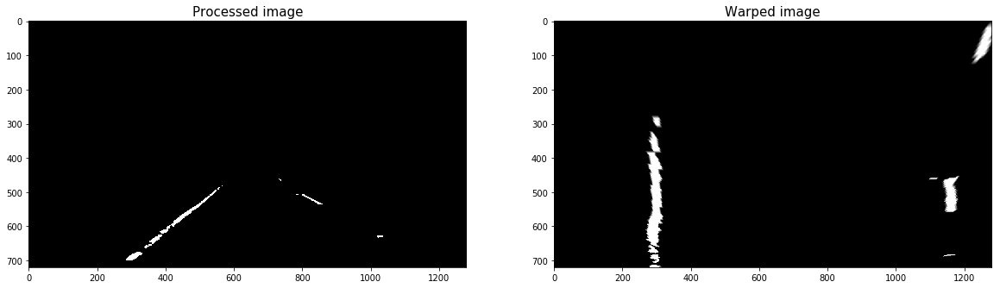

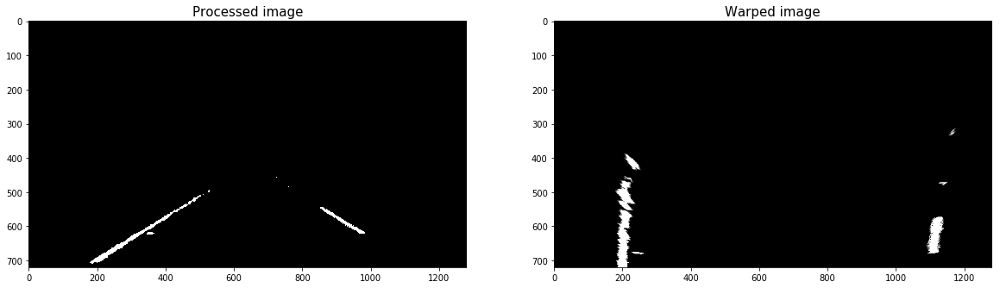

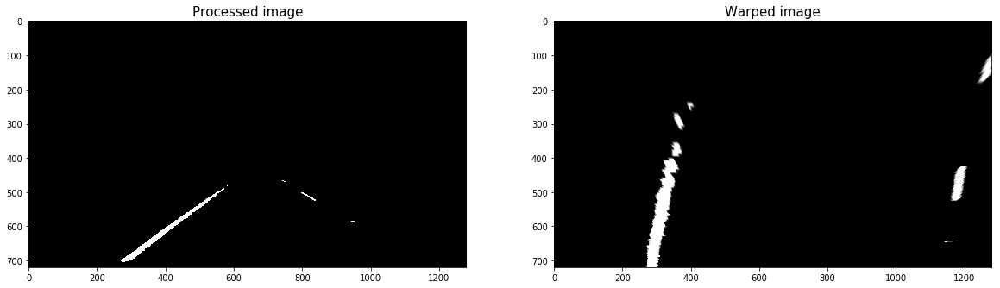

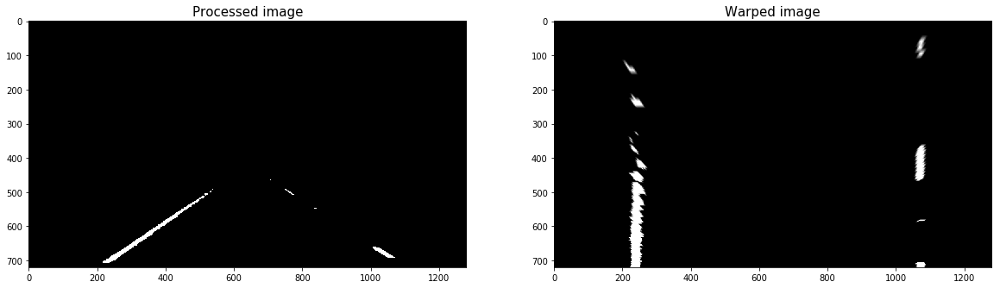

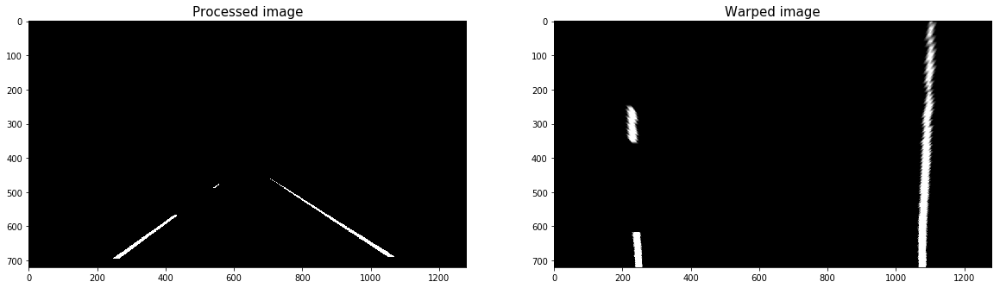

In [21]:
# Now we apply the previous transformation to the binary filtered images
matrices = []
matrices_inv = []
transformed_images = []
for image in processed_images:
    warped, M, Minv = processor.transform_image(image)
    transformed_images.append(warped)
    matrices.append(M)
    matrices_inv.append(Minv)
    
    # We show the processed image and the warped image
    _, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(image, cmap='gray')
    ax1.set_title('Processed image', fontsize=15)
    ax2.imshow(warped, cmap='gray')
    ax2.set_title('Warped image', fontsize=15)

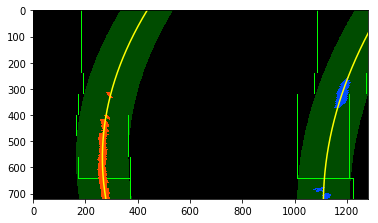

In [22]:
out_img, left_fitx, right_fitx, ploty = processor.plot_lanes(transformed_images[0])

plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.savefig('output_images/lane_detection.png', dpi=300)

(720, 0)

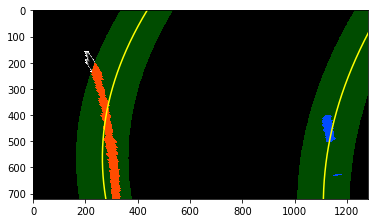

In [23]:
# Assume you now have a new warped binary image 
# from the next frame of video
# It's now much easier to find line pixels!
out_img, left_fitx, right_fitx, ploty = processor.plot_lanes(transformed_images[1])

# We try to find the new lanes closer to the previous one
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

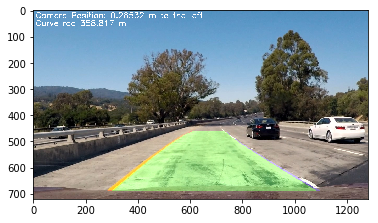

In [24]:
result = processor.draw_lanes(transformed_images[0], images[0], matrices_inv[0], False)
plt.figure()
plt.imshow(result)
plt.savefig('output_images/result.png', dpi=300)

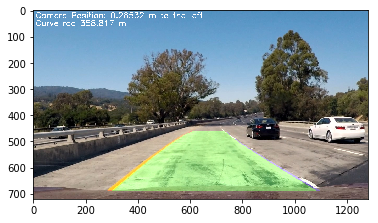

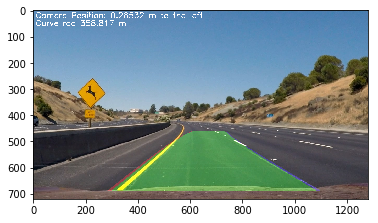

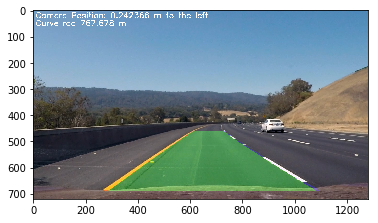

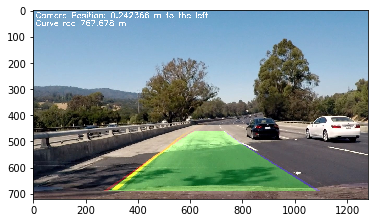

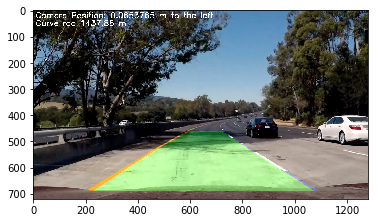

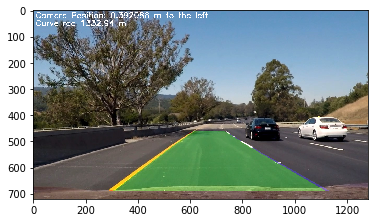

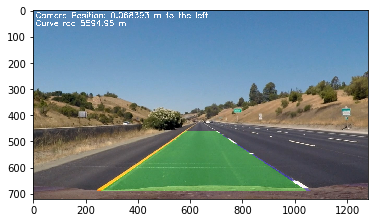

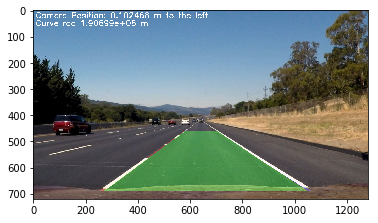

In [25]:
for idx, warped in enumerate(transformed_images):
    result = processor.draw_lanes(warped, images[idx], matrices_inv[idx], False)
    plt.figure()
    plt.imshow(result)

In [26]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output = 'output_images/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(processor.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output_images/project_video.mp4
[MoviePy] Writing video output_images/project_video.mp4


100%|█████████▉| 1260/1261 [01:33<00:00, 13.30it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video.mp4 

CPU times: user 2min 28s, sys: 14.4 s, total: 2min 43s
Wall time: 1min 33s
